In [ ]:
import os
import re
import json
import pandas as pd

def generar_tablas_estaciones(directorio_estaciones, logger=None, view=None):
  # directorio_estaciones: directorio donde se encuentran los archivos JSON
  # logger: (true) vuelca por pantalla la secuencia de ficheros leídos
  # Diccionario para almacenar los DataFrames por estación
  # Cada clave será el código de la estación (ej. 'C302')
  # Cada valor será un DataFrame con 'Tiempo', 'Estación' y columnas para cada sustancia
  matrices_tiempo_por_estacion = {}

  # Patrón para extraer el código de la estación y la sustancia del nombre del archivo
  patron_nombre_archivo = re.compile(r"^(C\d{3})_(.+)\.json$")

  # Obtener la lista de archivos y ordenarla
  lista_archivos = os.listdir(directorio_estaciones)
  lista_archivos.sort()

  # Iterar sobre los archivos en el directorio
  for nombre_archivo in lista_archivos:
      match = patron_nombre_archivo.match(nombre_archivo)
      if match:
          codigo_estacion = match.group(1)
          sustancia = match.group(2)
          ruta_completa_archivo = os.path.join(directorio_estaciones, nombre_archivo)
          if logger:
            print(f"Procesando archivo: {nombre_archivo} (Estación: {codigo_estacion}, Sustancia: {sustancia})")

          try:
              # Leer el archivo JSON
              with open(ruta_completa_archivo, 'r', encoding='utf-8') as f:
                  datos_json = json.load(f)

              # Asumimos que los datos relevantes están bajo "response" y luego "valores"
              valores = datos_json.get("response", {}).get("valores", [])

              if not valores:
                  print(f"ADVERTENCIA: No se encontraron valores en el archivo {nombre_archivo}.")
                  continue

              # Crear un DataFrame temporal para esta sustancia y estación
              df_sustancia = pd.DataFrame(valores)

              # Renombrar la columna 'value_formateado' con el nombre de la sustancia
              if 'value_formateado' in df_sustancia.columns:
                  # Convertir a numérico, coaccionando errores
                  df_sustancia[sustancia] = pd.to_numeric(df_sustancia['value_formateado'], errors='coerce')
                  # Seleccionar las columnas 'Tiempo' y la nueva columna de sustancia, y añadir 'Estación'
                  df_sustancia = df_sustancia[['tiempo', sustancia]].copy() # Usar copy() para evitar SettingWithCopyWarning
                  df_sustancia['Estación'] = codigo_estacion # Añadir la columna 'Estación'

                  # Renombrar 'tiempo' a 'Tiempo' para consistencia
                  df_sustancia.rename(columns={'tiempo': 'Tiempo'}, inplace=True)

              else:
                  print(f"ADVERTENCIA: Columna 'value_formateado' no encontrada en {nombre_archivo}.")
                  continue

              # Fusionar este DataFrame de sustancia con el DataFrame existente para la estación
              if codigo_estacion not in matrices_tiempo_por_estacion:
                  # Si es la primera sustancia para esta estación, inicializar el DataFrame
                  matrices_tiempo_por_estacion[codigo_estacion] = df_sustancia[['Tiempo', 'Estación', sustancia]] # Incluir Estación aquí
              else:
                  # Fusionar sobre las columnas 'Tiempo' y 'Estación'
                  matrices_tiempo_por_estacion[codigo_estacion] = pd.merge(
                      matrices_tiempo_por_estacion[codigo_estacion],
                      df_sustancia[['Tiempo', 'Estación', sustancia]], # Fusionar con Estación y Sustancia
                      on=['Tiempo', 'Estación'],
                      how='outer' # Usar outer join para mantener todos los tiempos y estaciones
                  )

          except FileNotFoundError:
              print(f"ERROR: No se encontró el archivo en la ruta: {ruta_completa_archivo}")
          except json.JSONDecodeError:
              print(f"ERROR: No se pudo decodificar el archivo JSON {ruta_completa_archivo}. Verifica su formato.")
          except Exception as e:
              print(f"Ocurrió un error inesperado al procesar {nombre_archivo}: {e}")

  # Ordenar los DataFrames por 'Tiempo' y 'Estación' y reordenar columnas para mostrar 'Estación' después de 'Tiempo'
  print("\n--- DataFrames de Series de Tiempo por Estación ---")
  for estacion, df_tiempo in matrices_tiempo_por_estacion.items():
      #if view:
      # print(f"\nEstación: {estacion}")

      df_tiempo.sort_values(["Estación", "Tiempo"], inplace=True)

      # Reordenar columnas: poner 'Estación' después de 'Tiempo'
      cols = df_tiempo.columns.tolist()
      if 'Tiempo' in cols and 'Estación' in cols:
          cols.remove('Estación')
          cols.insert(cols.index('Tiempo') + 1, 'Estación')
          df_tiempo = df_tiempo[cols]
      if view:
        print(f"\nEstación: {estacion}")
        display(df_tiempo)

  # Ahora 'matrices_tiempo_por_estacion' es un diccionario donde cada clave es el código de la estación
  # y cada valor es un DataFrame con 'Tiempo', 'Estación' y columnas para cada sustancia encontrada para esa estación.

  # Añadir el retorno del diccionario
  return matrices_tiempo_por_estacion

Modificación de la función **generar_tablas_estaciones()**, para que pueda admitir el procesado de un conjunto de batches de datos.

In [ ]:
import os
import re
import json
import pandas as pd

# MODIFICACIÓN 1: Añadimos el parámetro 'matrices_acumuladas'
def generar_tablas_estaciones(directorio_estaciones, matrices_acumuladas=None, logger=None, view=None):
    # MODIFICACIÓN 2: Si no recibimos datos previos, inicializamos un diccionario vacío
    if matrices_acumuladas is None:
        matrices_tiempo_por_estacion = {}
    else:
        matrices_tiempo_por_estacion = matrices_acumuladas

    patron_nombre_archivo = re.compile(r"^(C\d{3})_(.+)\.json$")
    lista_archivos = os.listdir(directorio_estaciones)
    lista_archivos.sort()

    for nombre_archivo in lista_archivos:
        match = patron_nombre_archivo.match(nombre_archivo)
        if match:
            codigo_estacion = match.group(1)
            sustancia = match.group(2)
            ruta_completa_archivo = os.path.join(directorio_estaciones, nombre_archivo)

            if logger:
                print(f"Procesando archivo: {nombre_archivo} (Estación: {codigo_estacion}, Sustancia: {sustancia})")

            try:
                with open(ruta_completa_archivo, 'r', encoding='utf-8') as f:
                    datos_json = json.load(f)

                valores = datos_json.get("response", {}).get("valores", [])
                if not valores:
                    continue

                df_sustancia = pd.DataFrame(valores)

                if 'value_formateado' in df_sustancia.columns:
                    df_sustancia[sustancia] = pd.to_numeric(df_sustancia['value_formateado'], errors='coerce')
                    df_sustancia = df_sustancia[['tiempo', sustancia]].copy()
                    df_sustancia['Estación'] = codigo_estacion
                    df_sustancia.rename(columns={'tiempo': 'Tiempo'}, inplace=True)
                else:
                    continue

                # MODIFICACIÓN 3: Lógica de fusión mejorada para acumulados
                if codigo_estacion not in matrices_tiempo_por_estacion:
                    matrices_tiempo_por_estacion[codigo_estacion] = df_sustancia[['Tiempo', 'Estación', sustancia]]
                else:
                    # Si la sustancia ya existe en el DataFrame previo, concatenamos filas (nuevos tiempos)
                    # Si es una sustancia nueva, hacemos el merge (nuevas columnas)
                    df_existente = matrices_tiempo_por_estacion[codigo_estacion]

                    if sustancia in df_existente.columns:
                        # Acumular nuevas filas (datos nuevos del mismo contaminante)
                        matrices_tiempo_por_estacion[codigo_estacion] = pd.concat(
                            [df_existente, df_sustancia], ignore_index=True
                        ).drop_duplicates(subset=['Tiempo', 'Estación'], keep='last')
                    else:
                        # Añadir nueva columna de sustancia
                        matrices_tiempo_por_estacion[codigo_estacion] = pd.merge(
                            df_existente,
                            df_sustancia[['Tiempo', 'Estación', sustancia]],
                            on=['Tiempo', 'Estación'],
                            how='outer'
                        )

            except Exception as e:
                print(f"Error en {nombre_archivo}: {e}")

    # Ordenación y limpieza final
    for estacion in matrices_tiempo_por_estacion:
        df_tiempo = matrices_tiempo_por_estacion[estacion]
        df_tiempo.sort_values(["Estación", "Tiempo"], inplace=True)

        # Reordenar columnas
        cols = df_tiempo.columns.tolist()
        if 'Tiempo' in cols and 'Estación' in cols:
            cols.remove('Estación')
            cols.insert(cols.index('Tiempo') + 1, 'Estación')
            matrices_tiempo_por_estacion[estacion] = df_tiempo[cols]

    return matrices_tiempo_por_estacion

# --- EJEMPLO DE USO ACUMULATIVO ---
# batch1 = generar_tablas_estaciones("ruta/batch1")
# batch2 = generar_tablas_estaciones("ruta/batch2", matrices_acumuladas=batch1)

In [ ]:
def generar_conjunto_medidas(matrices_tiempo_por_estacion):
    """
    Une todos los DataFrames de estaciones en uno solo, rellenando con ceros
    las sustancias que no estén presentes en alguna estación.

    Parámetros:
        matrices_tiempo_por_estacion (dict): Diccionario con claves de estación
        y valores DataFrames con columnas ['Tiempo', 'Estación', sustancia1, sustancia2, ...]

    Retorna:
        pd.DataFrame: DataFrame unificado con todas las estaciones y sustancias.
    """
    # Lista para acumular los DataFrames
    lista_df = []

    for estacion, df in matrices_tiempo_por_estacion.items():
        # Asegurar que todas las columnas de sustancias estén presentes
        lista_df.append(df)

    # Unir todos los DataFrames, alineando por columnas
    df_conjunto = pd.concat(lista_df, axis=0, ignore_index=True)

    # Rellenar NaNs en columnas de sustancias con 0.0
    columnas_sustancias = df_conjunto.columns.difference(['Tiempo', 'Estación'])
    df_conjunto[columnas_sustancias] = df_conjunto[columnas_sustancias].fillna(0.0)

    # Ordenar por estación y tiempo
    df_conjunto.sort_values(['Estación', 'Tiempo'], inplace=True)
    display(df_conjunto)
    return df_conjunto


In [ ]:
import pandas as kd
import os
import json
# Biblioteca para dar formato a las tablas en Google Colab
from google.colab import data_table
data_table.enable_dataframe_formatter()

dir_estaciones = '/content/Estaciones'

# Inicializamos el contenedor
river_dataset = None
carpetas = []

# Lista de carpetas
for root, dirs, files in os.walk(dir_estaciones):
    # Only process the immediate subdirectories of dir_estaciones
    if root == dir_estaciones:
        for d in dirs:
            # Exclude specific directories if needed, e.g., '.ipynb_checkpoints'
            if not d.startswith('.'):
                carpetas.append(os.path.join(root, d))
        break # Only process the top-level directory and its immediate subdirectories

print(f"Carpetas encontradas: {carpetas}")
#carpetas = ["Estaciones/batch1", "Estaciones/batch2", "Estaciones/batch3"]

for carpeta in carpetas:
    print(f"--- Cargando {carpeta} ---")
    river_dataset = generar_tablas_estaciones(carpeta, matrices_acumuladas=river_dataset)

# Al final, river_dataset contiene la suma de todos los lotes.
# display(river_dataset)
df_total = generar_conjunto_medidas(river_dataset)


Carpetas encontradas: ['/content/Estaciones/batch2', '/content/Estaciones/batch1']
--- Cargando /content/Estaciones/batch2 ---
--- Cargando /content/Estaciones/batch1 ---


,Tiempo,Estación,AMONIO,CONDUCTIVIDAD,NITRATOS,OXIGENO_DISUELTO,PH,TEMPERATURA,TURBIDEZ,CLOROFILA,FICOCIANINAS,CARBONO_ORGANICO,FOSFATOS,NIVEL
0,01/11/2025 00:00,C302,0.48,2057.0,0.0,8.84,8.1,15.2,15.3,0.0,0.0,0.0,0.0,0.0
1,01/11/2025 01:00,C302,0.48,2061.0,0.0,8.86,8.1,15.2,15.4,0.0,0.0,0.0,0.0,0.0
2,01/11/2025 02:00,C302,0.48,2063.0,0.0,8.88,8.1,15.2,15.4,0.0,0.0,0.0,0.0,0.0
3,01/11/2025 03:00,C302,0.48,2062.0,0.0,8.88,8.1,15.2,15.9,0.0,0.0,0.0,0.0,0.0
4,01/11/2025 04:00,C302,0.48,2058.0,0.0,8.87,8.1,15.1,15.7,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14435,31/10/2025 19:00,C345,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14436,31/10/2025 20:00,C345,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14437,31/10/2025 21:00,C345,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14438,31/10/2025 22:00,C345,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Tabla con el resumen estasdístico de las medidas para todas las estaciones.

In [ ]:
display(round(df_total.describe(),4))

,AMONIO,CONDUCTIVIDAD,NITRATOS,OXIGENO_DISUELTO,PH,TEMPERATURA,TURBIDEZ,CLOROFILA,FICOCIANINAS,CARBONO_ORGANICO,FOSFATOS,NIVEL
count,14440.0000,14440.0000,14440.0000,14440.0000,14440.0000,14440.0000,14440.0000,14440.0000,14440.0000,14440.0000,14440.0000,14440.0000
mean,1.3578,356.6414,9.1785,2.9484,3.2873,8.0931,23.8740,2.6546,32.3972,2.1089,0.0697,0.1510
std,6.4931,549.7431,66.6648,3.8017,3.8131,8.5576,116.0525,13.6275,260.1629,6.1513,0.2667,0.5386
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.2000,0.0000,0.0000,0.0000,0.0000,0.0000
50%,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,10.4000,0.0000,0.0000,0.0000,0.0000,0.0000
75%,0.0000,689.0000,0.0000,6.6600,7.5000,15.4000,18.0000,0.0000,0.0000,0.0000,0.0000,0.0000
max,130.0000,2246.0000,520.0000,11.5400,12.5000,30.6000,5000.0000,114.2000,3633.0000,80.0000,2.4000,3.7200


Se procede a generar gráficas lineales en 2D para visualizar los cambios de las medidas de cada substancia para cada estación mediante **df_total**, excluyendo la estación 'C345', por no tener valores. Se mostrará el 'Tiempo' en el eje **X**, y los valores de las substancias en el eje **Y**, con líneas distintivas de colores para cada estación.

Se usan las librerías **`matplolib.pyplot`** para las gráficas y la librería **`seaborn`** construida sobre *Matplotlib* que simplifica la creación de gráficos estadísticos avanzados. Su enfoque principal es proporcionar visualizaciones que no solo sean atractivas, sino también informativas.



In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# print("Importación de las librerías matplotlib.pyplot y seaborn con éxito.")

**Preparación de los datos para el grafiado.**

Este paso implica convertir la columna de 'Tiempo" a formato datetime, para el correcto grafiado de las series de tiempo, y el filtrado de la estaciones con valores 0, como la C345. Además, se identifican las columnas de substancias para iterar en el grafiado.



In [ ]:
#df_filtered = df_total[df_total['Estación'] != 'C345'].copy()
df_filtered = df_total.copy()

# Convert 'Tiempo' to datetime
df_filtered['Tiempo'] = pd.to_datetime(df_filtered['Tiempo'], format='%d/%m/%Y %H:%M')

# Identify substance columns
substance_columns = df_filtered.columns.drop(['Tiempo', 'Estación']).tolist()

# Identify stations where all substance measurements are zero
# Group by 'Estación' and check if there's any non-zero value across all substance columns for each station
stations_with_non_zero_substances = df_filtered.groupby('Estación')[substance_columns].apply(lambda x: (x != 0.0).any().any())
stations_to_exclude_due_to_zeros = stations_with_non_zero_substances[~stations_with_non_zero_substances].index.tolist()

# Filter out stations where all substance measurements are zero
if stations_to_exclude_due_to_zeros:
    df_filtered = df_filtered[~df_filtered['Estación'].isin(stations_to_exclude_due_to_zeros)].copy()
    print(f"Filtered out stations with all zero substance measurements: {stations_to_exclude_due_to_zeros}")

# If Amonio<0 or Armonio>20 discard value
if 'AMONIO' in df_filtered.columns:
    df_filtered.loc[(df_filtered['AMONIO'] < 0) | (df_filtered['AMONIO'] > 20), 'AMONIO'] = float('nan')

# If Carbono<0 or Carbono >=50 value NaN
if 'CARBONO_ORGANICO' in df_filtered.columns:
    df_filtered.loc[(df_filtered['CARBONO_ORGANICO'] < 0) | (df_filtered['CARBONO_ORGANICO'] >= 50), 'CARBONO_ORGANICO'] = float('nan')

# If Clorofila<0 or Clorofila>500 value NaN
if 'CLOROFILA' in df_filtered.columns:
    df_filtered.loc[(df_filtered['CLOROFILA'] < 0) | (df_filtered['CLOROFILA'] > 500), 'CLOROFILA'] = float('nan')

# If Conductividad<20 or Conductividad>5000 value NaN
if 'CONDUCTIVIDAD' in df_filtered.columns:
    df_filtered.loc[(df_filtered['CONDUCTIVIDAD'] < 20) | (df_filtered['CONDUCTIVIDAD'] > 5000), 'CONDUCTIVIDAD'] = float('nan')

# If Ficocianinas<0 or Ficocianinas>1000 value NaN
if 'FICOCIANINAS' in df_filtered.columns:
    df_filtered.loc[(df_filtered['FICOCIANINAS'] < 0) | (df_filtered['FICOCIANINAS'] > 1000), 'FICOCIANINAS'] = float('nan')

# If Fosfatos<0 value NaN
if 'FOSFATOS' in df_filtered.columns:
    df_filtered.loc[df_filtered['FOSFATOS'] < 0, 'FOSFATOS'] = float('nan')

# if Fosfatos>1000 es un vertido

# if Nitratos<0 or Nitratos>250 value NaN
if 'NITRATOS' in df_filtered.columns:
    df_filtered.loc[(df_filtered['NITRATOS'] < 0) | (df_filtered['NITRATOS'] > 250), 'NITRATOS'] = float('nan')

# if Nivel<0 or Nivel>20 value NaN
if 'NIVEL' in df_filtered.columns:
    df_filtered.loc[(df_filtered['NIVEL'] < 0) | (df_filtered['NIVEL'] > 20), 'NIVEL'] = float('nan')

# if Oxígeno Disuelto<0 or Oxígeno Disuelto>20 value NaN
if 'OXIGENO_DISUELTO' in df_filtered.columns:
    df_filtered.loc[(df_filtered['OXIGENO_DISUELTO'] < 0) | (df_filtered['OXIGENO_DISUELTO'] > 20),
                    'OXIGENO_DISUELTO'] = float('nan')
# if pH<4 or pH>10.5 value NaN
if 'PH' in df_filtered.columns:
    df_filtered.loc[(df_filtered['PH'] < 4) | (df_filtered['PH'] > 10.5), 'PH'] = float('nan')

# if Temperatura<0 or Temperatura>38 value NaN
if 'TEMPERATURA' in df_filtered.columns:
    df_filtered.loc[(df_filtered['TEMPERATURA'] < 0) | (df_filtered['TEMPERATURA'] > 38), 'TEMPERATURA'] = float('nan')

# if Turbidez<0 or Turbidez>2000 value NaN
if 'TURBIDEZ' in df_filtered.columns:
    df_filtered.loc[(df_filtered['TURBIDEZ'] < 0) | (df_filtered['TURBIDEZ'] > 2000), 'TURBIDEZ'] = float('nan')

# print(f"Filtered out station 'C345'. DataFrame shape: {df_total[df_total['Estación'] != 'C345'].shape}")
print(f"Final DataFrame shape after filtering all-zero substance stations: {df_filtered.shape}")
print(f"'Tiempo' column converted to datetime format.")
print(f"Substance columns identified: {substance_columns}")

Filtered out stations with all zero substance measurements: ['C308', 'C345']
Final DataFrame shape after filtering all-zero substance stations: (13477, 14)
'Tiempo' column converted to datetime format.
Substance columns identified: ['AMONIO', 'CONDUCTIVIDAD', 'NITRATOS', 'OXIGENO_DISUELTO', 'PH', 'TEMPERATURA', 'TURBIDEZ', 'CLOROFILA', 'FICOCIANINAS', 'CARBONO_ORGANICO', 'FOSFATOS', 'NIVEL']


Una vez que los datos están preparados y las columnas de substancias están identificadas, se itera a través de cada columna de substancia para generar las gráficas de líneas 2D. Cada gráfica visualiza el cambio de concentración de las substancias a lo largo del tiempo (exclusión de C345).



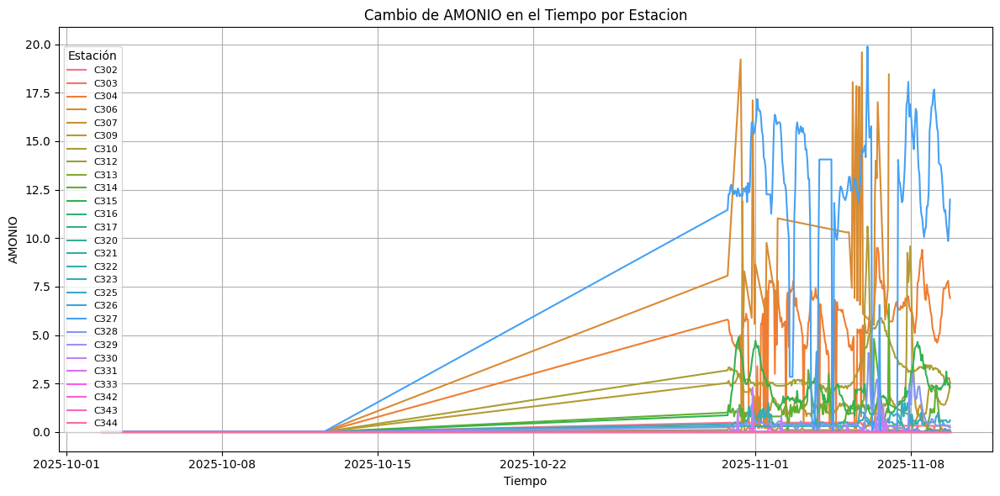

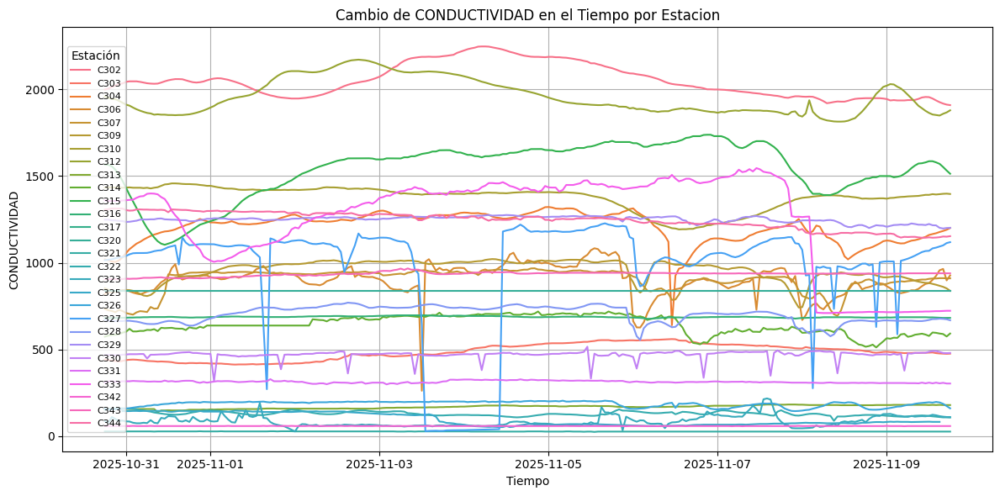

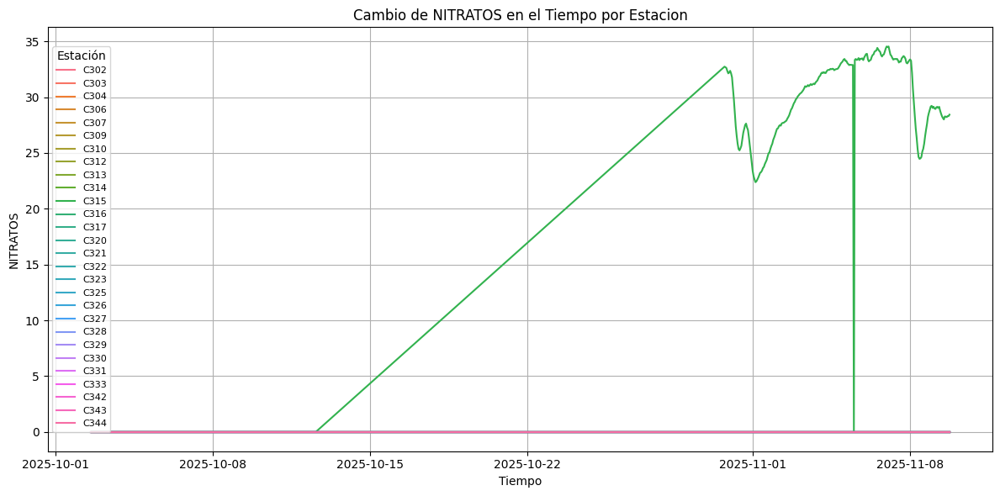

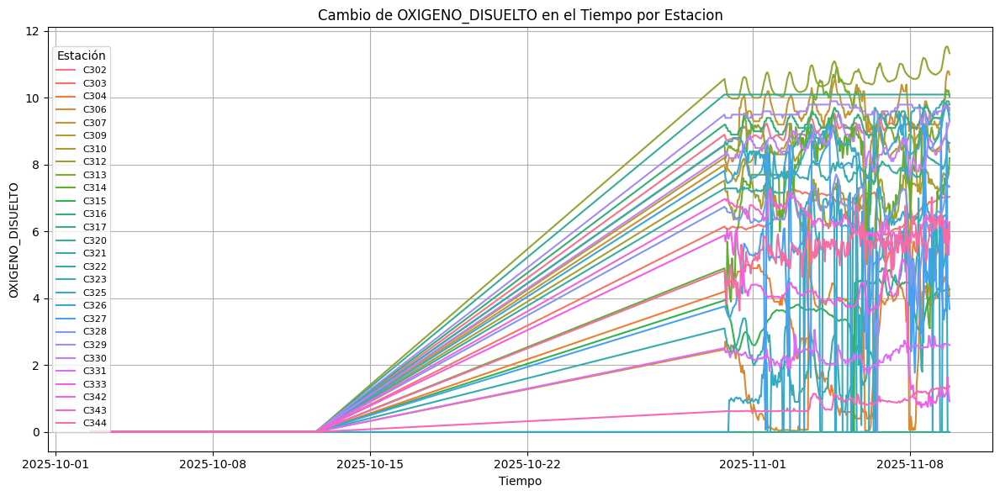

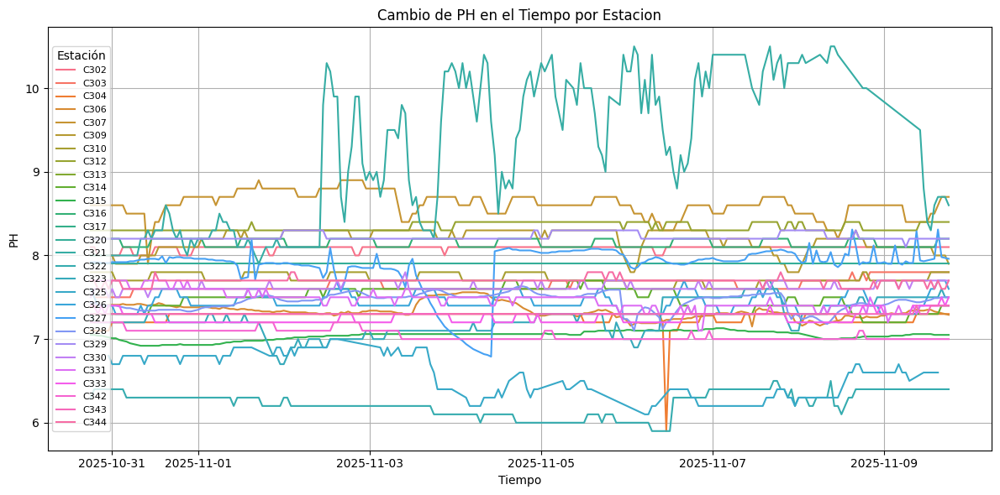

...

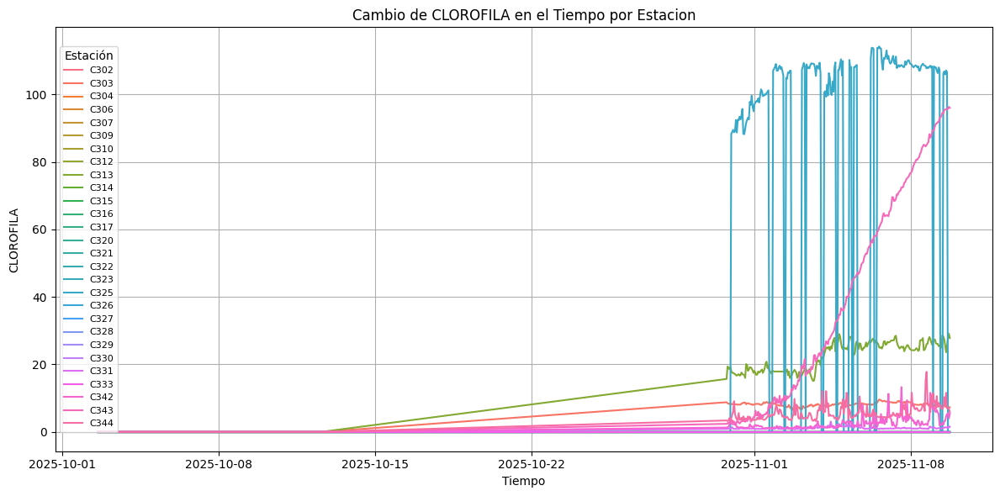

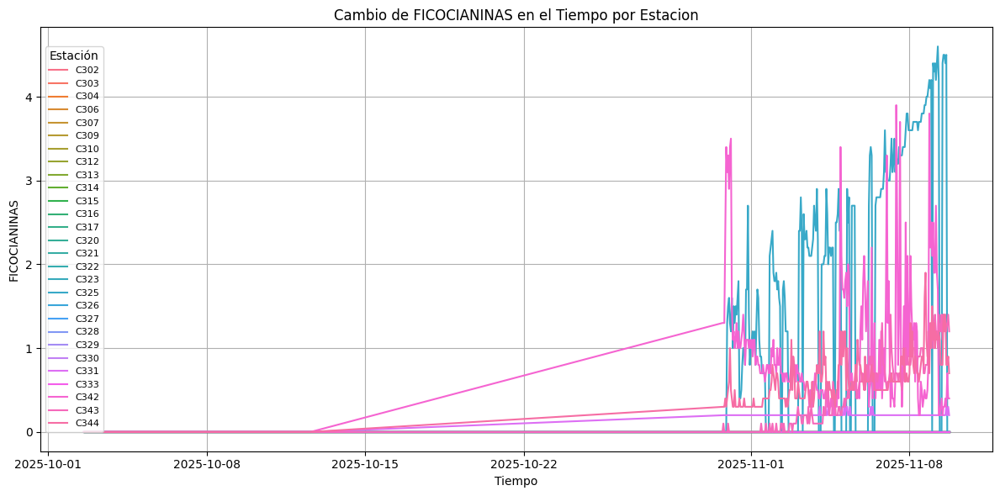

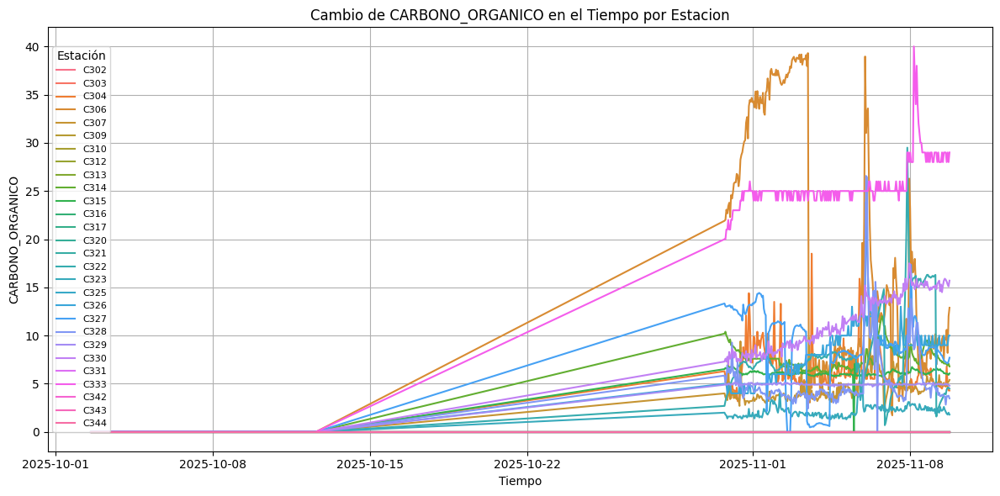

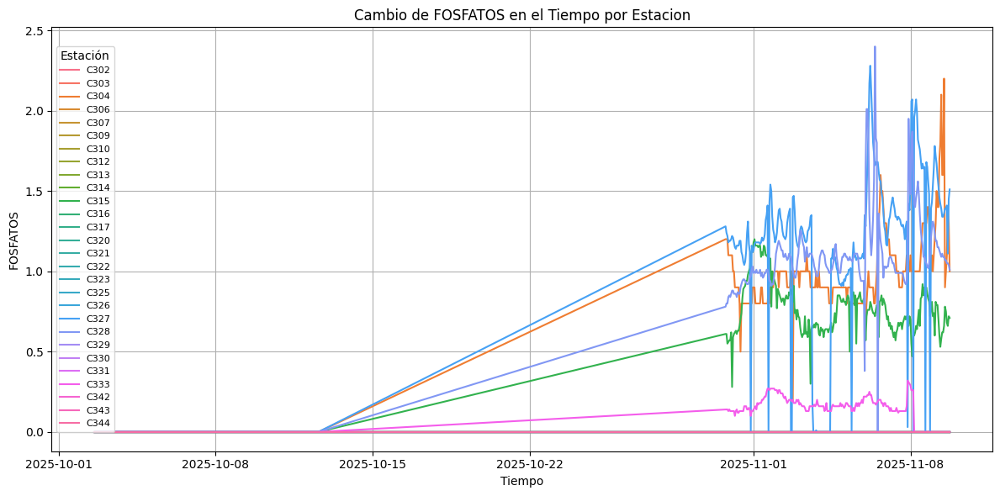

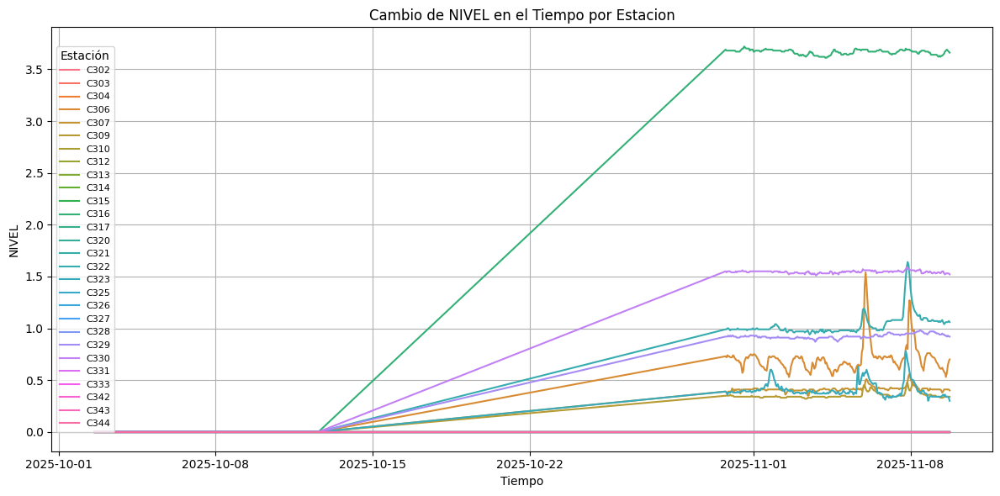

In [ ]:
for substance in substance_columns:
    plt.figure(figsize=(12, 6))
    sns.lineplot(data=df_filtered, x='Tiempo', y=substance, hue='Estación', errorbar=None)
    plt.title(f'Cambio de {substance} en el Tiempo por Estacion (excepto C345)')
    plt.xlabel('Tiempo')
    plt.ylabel(substance)
    plt.grid(True)
    plt.legend(title='Estación', fontsize=8, loc="center left") # Adjusted legend position
    plt.tight_layout()
    plt.show()

### Primeros objetivos obtenidos en el análisis de los datos
*   El dataset original tiene filtrados por exclusión la estación C345 ('df_filtered'),obteniéndose 6969 filas. Se puede extrapolar esta metodología para aquellas estaciones que no tengan datos.
*   La columna de 'Tiempo' ha sido convertida a formato datetime para un grafiado preciso de las series temporales de datos.
*   Se han identificado doce columnas de distintas substancias para la visualización: **`['AMONIO', 'CONDUCTIVIDAD', 'NITRATOS', 'OXIGENO_DISUELTO', 'PH', 'TEMPERATURA', 'TURBIDEZ', 'CLOROFILA', 'FICOCIANINAS', 'CARBONO_ORGANICO', 'FOSFATOS', 'NIVEL']`**.
*   A total of 12 2D line plots were generated, each illustrating the change of a specific substance over time, with separate lines representing different stations.


### Siguientes pasos
*   La generación de las gráficas proporciona una clara representación visual temporal de tendencias para diferentes substancias en las diferentes estaciones, lo que puede ser usado para identificar rápidamente patrones, anomalías, o correlaciones en los datos medioambientales.
*   El siguiente paso puede involucrar un análisis estadístico más detallado de las tendencias que se observan, comparando niveles de substancias y variabilidad a lo largo de las diferentes estaciones o realizar análisis de correlaciones entre diferentes tipos de substancias medidas.